In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

# Load data
df_sierraleone = pd.read_csv('../data/sierraleone.csv', parse_dates=['Timestamp'])

# Overview
df_sierraleone.info()
df_sierraleone.head()





<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Timestamp      525600 non-null  datetime64[ns]
 1   GHI            525600 non-null  float64       
 2   DNI            525600 non-null  float64       
 3   DHI            525600 non-null  float64       
 4   ModA           525600 non-null  float64       
 5   ModB           525600 non-null  float64       
 6   Tamb           525600 non-null  float64       
 7   RH             525600 non-null  float64       
 8   WS             525600 non-null  float64       
 9   WSgust         525600 non-null  float64       
 10  WSstdev        525600 non-null  float64       
 11  WD             525600 non-null  float64       
 12  WDstdev        525600 non-null  float64       
 13  BP             525600 non-null  int64         
 14  Cleaning       525600 non-null  int64         
 15  

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-10-30 00:01:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.1,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
1,2021-10-30 00:02:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
2,2021-10-30 00:03:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
3,2021-10-30 00:04:00,-0.7,0.0,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.1,22.3,22.6,NaN
4,2021-10-30 00:05:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN


In [3]:
# Summary statistics
df_sierraleone.describe()

# Missing value report
missing_report = df_sierraleone.isna().sum()
missing_report[missing_report > 0].sort_values(ascending=False)

# columns with > 5% missing
missing_percent = df_sierraleone.isna().mean() * 100
print(missing_percent[missing_percent > 5])


Comments    100.0
dtype: float64


In [8]:
#outlier detection
cols_to_check = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust']

df_sierraleone_zscore = df_sierraleone[cols_to_check].apply(zscore)
outliers = (df_sierraleone_zscore.abs() > 3).any(axis=1)
print(f"Number of outliers detected: {outliers.sum()}")

# Impute missing with median
for col in cols_to_check:
    median = df_sierraleone[col].median()
    df_sierraleone[col] = df_sierraleone[col].fillna(median)

df_sierraleone_clean = df_sierraleone[~outliers].copy()


Number of outliers detected: 16292


In [9]:
#save cleaned data
clean_path = "/data/sierraleone_clean.csv"
df_sierraleone_clean.to_csv('../data/sierraleone_clean.csv', index=False)
print(f"Cleaned data saved to {clean_path}")


Cleaned data saved to /data/sierraleone_clean.csv


C:\Users\Haile\Documents\kFT-AIM\solar-energy-solutions\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


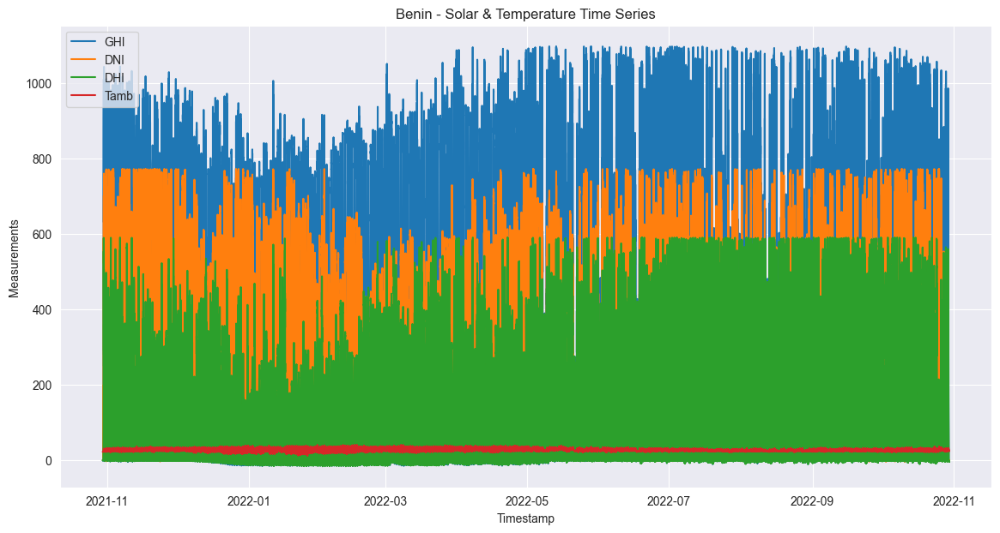

In [10]:
#Plot Time Series
plt.figure(figsize=(14,7))
plt.plot(df_sierraleone_clean['Timestamp'], df_sierraleone_clean['GHI'], label='GHI')
plt.plot(df_sierraleone_clean['Timestamp'], df_sierraleone_clean['DNI'], label='DNI')
plt.plot(df_sierraleone_clean['Timestamp'], df_sierraleone_clean['DHI'], label='DHI')
plt.plot(df_sierraleone_clean['Timestamp'], df_sierraleone_clean['Tamb'], label='Tamb')
plt.legend()
plt.title('Benin - Solar & Temperature Time Series')
plt.xlabel('Timestamp')
plt.ylabel('Measurements')
plt.show()

 

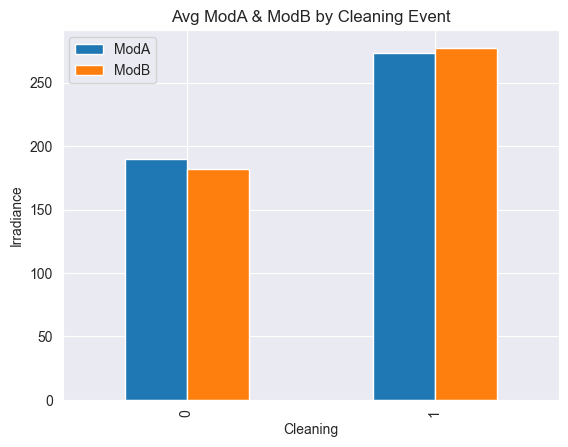

In [11]:
# Cleaning impact on sensor performance
df_sierraleone_clean.groupby('Cleaning')[['ModA', 'ModB']].mean().plot(kind='bar', title='Avg ModA & ModB by Cleaning Event')
plt.ylabel("Irradiance")
plt.show()


Average ModA & ModB by Cleaning flag:
                ModA        ModB
Cleaning                        
0         189.680780  181.598521
1         273.309252  277.231102


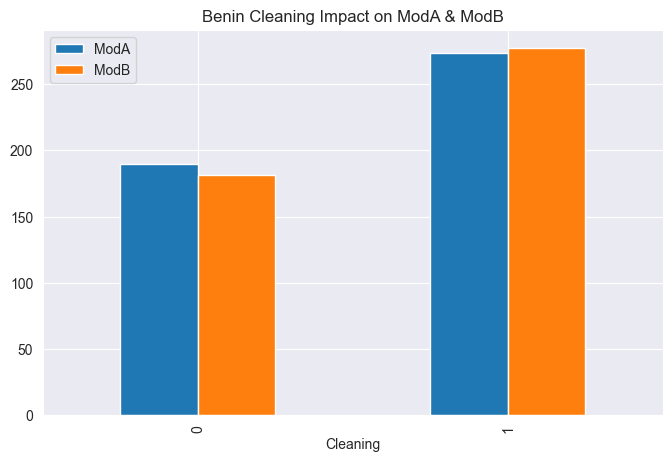

In [12]:
#Cleaning Impact on ModA and ModB

cleaning_group = df_sierraleone_clean.groupby('Cleaning')[['ModA', 'ModB']].mean()
print("Average ModA & ModB by Cleaning flag:")
print(cleaning_group)

cleaning_group.plot(kind='bar', figsize=(8,5), title='Benin Cleaning Impact on ModA & ModB')
plt.show()


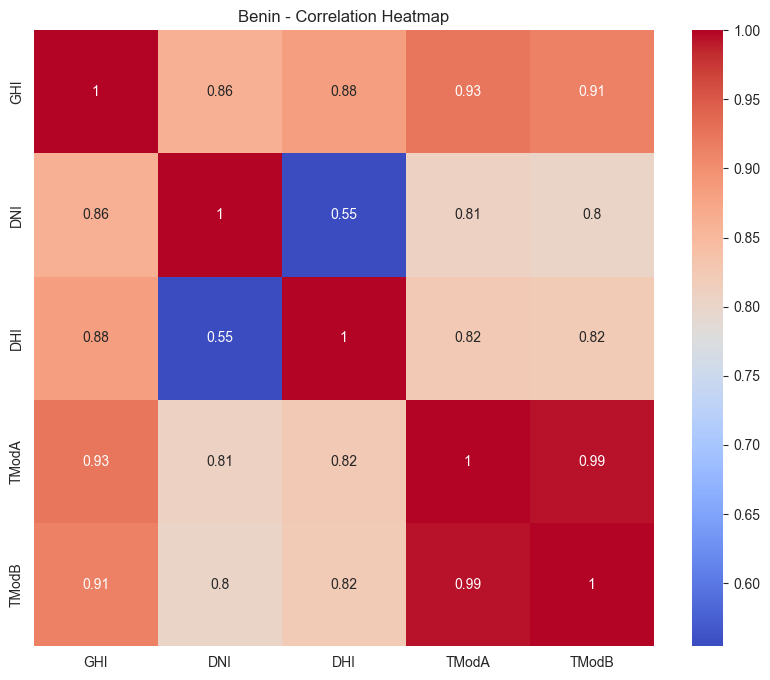

In [13]:
# Correlation Heatmap
plt.figure(figsize=(10,8))
sns.heatmap(df_sierraleone_clean[['GHI', 'DNI', 'DHI', 'TModA', 'TModB']].corr(), annot=True, cmap='coolwarm')
plt.title('Benin - Correlation Heatmap')
plt.show()

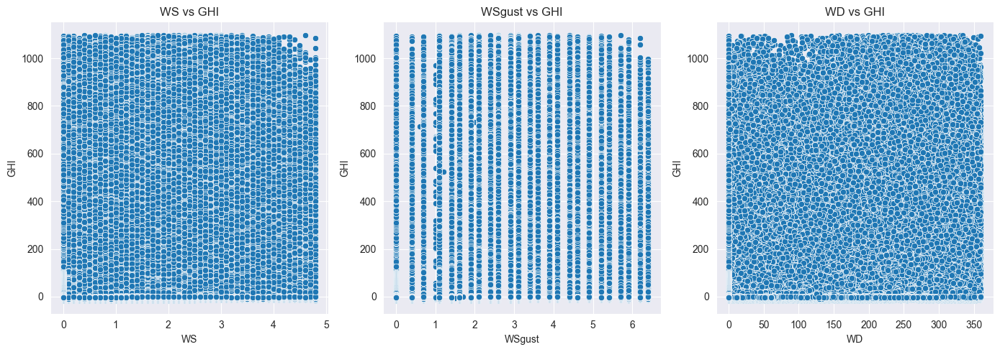

In [14]:
#Scatter Plots WS, WSgust, WD vs GHI
plt.figure(figsize=(14,5))

plt.subplot(1,3,1)
sns.scatterplot(x='WS', y='GHI', data=df_sierraleone_clean)
plt.title('WS vs GHI')

plt.subplot(1,3,2)
sns.scatterplot(x='WSgust', y='GHI', data=df_sierraleone_clean)
plt.title('WSgust vs GHI')

plt.subplot(1,3,3)
sns.scatterplot(x='WD', y='GHI', data=df_sierraleone_clean)
plt.title('WD vs GHI')

plt.tight_layout()
plt.show()


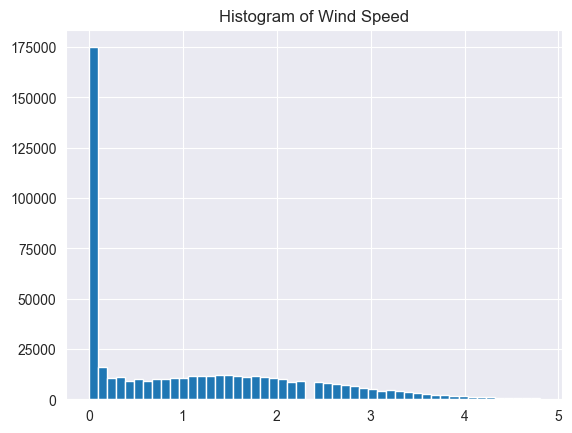

In [15]:
# Histogram of WS
df_sierraleone_clean['WS'].hist(bins=50)
plt.title("Histogram of Wind Speed")

# Wind direction rose (radial)
import plotly.express as px
fig = px.bar_polar(df_sierraleone_clean, r="WS", theta="WD", color="WS", template="plotly_dark")
fig.show()


Text(0.5, 1.0, 'RH vs Tamb')

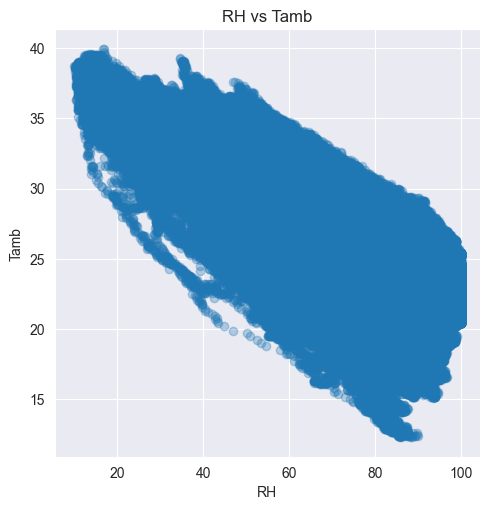

In [16]:
#temperture analysis
sns.lmplot(data=df_sierraleone_clean, x='RH', y='Tamb', scatter_kws={"alpha":0.3})
plt.title("RH vs Tamb")


In [ ]:
#Bubble Chart GHI vs Tamb (Bubble size = RH)
plt.figure(figsize=(8,6))
sizes = df_sierraleone_clean['RH'] * 5
plt.scatter(df_sierraleone_clean['Tamb'], df_sierraleone_clean['GHI'], s=sizes, alpha=0.5)
plt.xlabel('Ambient Temperature (°C)')
plt.ylabel('GHI (W/m²)')
plt.title('Benin - GHI vs Temperature (Bubble size = RH)')
plt.show()
